In [1]:
import pandas as pd
import numpy as np
import datetime
import math
import matplotlib.pyplot as plt
import seaborn as sns
import re
from IPython.display import display, HTML

In [2]:
import plotly.graph_objects as go
import plotly.express as px
from plotly.graph_objs import *
from bokeh.plotting import figure, output_notebook, show
from bokeh.models.tools import HoverTool
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource
from bokeh.palettes import cividis, inferno,Spectral3,Spectral4,Spectral5,Spectral6, Spectral7,Category20c
from bokeh.plotting import figure
from bokeh.transform import cumsum
output_notebook()

Loading BokehJS ...

In [3]:
#upload csv data
df = pd.read_csv('../data/category_price.csv')
df.head()

C:\Users\ernes\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Date_imp,Date_imp_d,Cluster,Category_name,name,price,disc_price,merchant,condition,Disc_percentage,...,shipping,sourceURLs,weight,Date_imp_d.1,Day_n,year,month,month_n,day,Week_Number
0,2017-03-30 06:00:00,2017/03/30,13,"mount, tv, stand",Sanus VLF410B1 10-Inch Super Slim Full-Motion ...,104.99,104.99,Bestbuy.com,New,0.00,...,NaN,http://www.bestbuy.com/site/sanus-tv-wall-moun...,32.8 pounds,2017/03/30,Thursday,2017,3,March,30,13
1,2017-03-10 22:00:00,2017/03/10,13,"mount, tv, stand",Sanus VLF410B1 10-Inch Super Slim Full-Motion ...,104.99,104.99,Bestbuy.com,New,0.00,...,NaN,http://www.bestbuy.com/site/sanus-tv-wall-moun...,32.8 pounds,2017/03/10,Friday,2017,3,March,10,10
2,2017-03-04 10:00:00,2017/03/04,13,"mount, tv, stand",Sanus VLF410B1 10-Inch Super Slim Full-Motion ...,104.99,104.99,Bestbuy.com,New,0.00,...,NaN,http://www.bestbuy.com/site/sanus-tv-wall-moun...,32.8 pounds,2017/03/04,Saturday,2017,3,March,4,9
3,2017-03-03 14:00:00,2017/03/03,13,"mount, tv, stand",Sanus VLF410B1 10-Inch Super Slim Full-Motion ...,104.99,104.99,Bestbuy.com,New,0.00,...,NaN,http://www.bestbuy.com/site/sanus-tv-wall-moun...,32.8 pounds,2017/03/03,Friday,2017,3,March,3,9
4,2017-12-14 06:00:00,2017/12/14,35,"speaker, portable, bluetooth",Boytone - 2500W 2.1-Ch. Home Theater System - ...,69.00,64.99,Walmart.com,New,0.06,...,Expedited,https://www.walmart.com/ip/BOYTONE-BT210FB-BLA...,14 pounds,2017/12/14,Thursday,2017,12,December,14,50


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34389 entries, 0 to 34388
Data columns (total 30 columns):
Date_imp           34389 non-null object
Date_imp_d         34389 non-null object
Cluster            34389 non-null int64
Category_name      34389 non-null object
name               34389 non-null object
price              34389 non-null float64
disc_price         34389 non-null float64
merchant           34389 non-null object
condition          34389 non-null object
Disc_percentage    34389 non-null float64
isSale             34389 non-null object
Imp_count          34389 non-null int64
brand              34389 non-null object
p_description      34389 non-null object
currency           34389 non-null object
dateAdded          34389 non-null object
dateSeen           34389 non-null object
dateUpdated        34389 non-null object
imageURLs          765 non-null object
manufacturer       18638 non-null object
shipping           16111 non-null object
sourceURLs         24704 non-nu

In [5]:
df['Date_imp'] = pd.to_datetime(df['Date_imp'])
df['hour'] = df['Date_imp'].dt.hour

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34389 entries, 0 to 34388
Data columns (total 31 columns):
Date_imp           34389 non-null datetime64[ns]
Date_imp_d         34389 non-null object
Cluster            34389 non-null int64
Category_name      34389 non-null object
name               34389 non-null object
price              34389 non-null float64
disc_price         34389 non-null float64
merchant           34389 non-null object
condition          34389 non-null object
Disc_percentage    34389 non-null float64
isSale             34389 non-null object
Imp_count          34389 non-null int64
brand              34389 non-null object
p_description      34389 non-null object
currency           34389 non-null object
dateAdded          34389 non-null object
dateSeen           34389 non-null object
dateUpdated        34389 non-null object
imageURLs          765 non-null object
manufacturer       18638 non-null object
shipping           16111 non-null object
sourceURLs         2470

## Keep only 'New' Condtion for Price Analysis

In [7]:
df['condition'].unique()

array(['New', 'Used', 'Refurbished', 'None', 'For parts or not working'],
      dtype=object)

In [8]:
df = df[df['condition'] == 'New']
#Drop columns that are not going to be used for the project
df = df[df.columns.drop(['condition'])]

## Use only USD prices 

In [9]:
#Analyze type of currency for pricing 
x = df['currency'].value_counts()
print("Currency Make-up Percentage")
print('*'*50)
print(x/len(df.index))
print()
print("Currency Make-up Value Counts")
print('*'*50)
print(x)

Currency Make-up Percentage
**************************************************
USD    0.999933
EUR    0.000034
CAD    0.000034
Name: currency, dtype: float64

Currency Make-up Value Counts
**************************************************
USD    29639
EUR        1
CAD        1
Name: currency, dtype: int64


In [10]:
df_us = df[df['currency'] == 'USD']

## Detect Items without Price Variation

In [11]:
#Filter only the impressions with price variation for further analysis
# at least 5 different prices
df_detect = df_us.groupby('name')['disc_price'].nunique()
df_detect = df_detect.to_frame().reset_index()
df_detect.columns = ['name','disc_price']
df_detect

valid_items = df_detect[df_detect['disc_price'] > 5]
valid_items = valid_items['name'].tolist()

In [12]:
#Print Deleted Impressions with price variability
df_clean = df_us[df_us['name'].isin(valid_items)]

In [13]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19627 entries, 4 to 34388
Data columns (total 30 columns):
Date_imp           19627 non-null datetime64[ns]
Date_imp_d         19627 non-null object
Cluster            19627 non-null int64
Category_name      19627 non-null object
name               19627 non-null object
price              19627 non-null float64
disc_price         19627 non-null float64
merchant           19627 non-null object
Disc_percentage    19627 non-null float64
isSale             19627 non-null object
Imp_count          19627 non-null int64
brand              19627 non-null object
p_description      19627 non-null object
currency           19627 non-null object
dateAdded          19627 non-null object
dateSeen           19627 non-null object
dateUpdated        19627 non-null object
imageURLs          430 non-null object
manufacturer       10738 non-null object
shipping           10469 non-null object
sourceURLs         15962 non-null object
weight             1955

In [14]:
#Print Deleted Impressions with price variability
print("Sustainable Price Variability Impressions for further price regression analysis model: ", len(df_clean))
print("Percentage Deleted: "+"{:.2%}".format(1 - len(df_clean)/ len(df_us)))

Sustainable Price Variability Impressions for further price regression analysis model:  19627
Percentage Deleted: 33.78%


In [15]:
ranks = df_clean.groupby("Category_name")["disc_price"].mean().fillna(0).sort_values()[::-1].index
order = {"Category_name": ranks}


fig = px.box(df, x="disc_price", y="Category_name",
             title="Price distribution per Category", category_orders=order, width = 3000, height = 1500)    
fig.show()

[Text(0.5, 1.0, 'Price Distribution per Category ')]

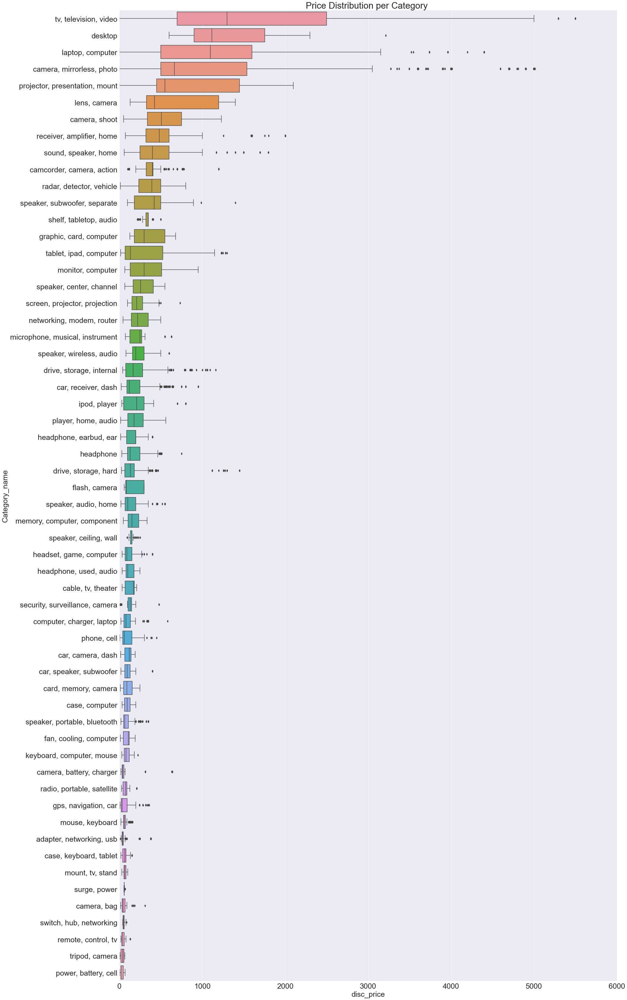

In [16]:
#Price Boxplot per Category
ranks = df_clean.groupby("Category_name")["disc_price"].mean().fillna(0).sort_values()[::-1].index

plt.rcParams['figure.figsize'] = [30, 60]
plt.rcParams['font.size'] = 25
sns.set_style("darkgrid")
ax1 = sns.boxplot( x = df_clean['disc_price'] , y = df_clean['Category_name'], orient = "h", order = ranks)
ax1.set(xlim = (0, 6000))
ax1.set(title = "Price Distribution per Category ")

## Detect relevant items for analysis

In [17]:
top_products = ['JBL Clip2 Portable Speaker',
                'Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"', 
                'Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"',
                'MCR-B043 30W Bluetooth Wireless Music System (Black)',
                'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"',
                'Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"',
                'Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"']

In [18]:
print(len(top_products))

7


In [19]:
df_clean = df_clean[df_clean['name'].isin(top_products)]

In [20]:
df_clean.groupby('name').size()

name
Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"     52
Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"            20
JBL Clip2 Portable Speaker                                                          201
Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"                       20
MCR-B043 30W Bluetooth Wireless Music System (Black)                                 25
Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"      22
Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"          29
dtype: int64

In [21]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 369 entries, 3328 to 27186
Data columns (total 30 columns):
Date_imp           369 non-null datetime64[ns]
Date_imp_d         369 non-null object
Cluster            369 non-null int64
Category_name      369 non-null object
name               369 non-null object
price              369 non-null float64
disc_price         369 non-null float64
merchant           369 non-null object
Disc_percentage    369 non-null float64
isSale             369 non-null object
Imp_count          369 non-null int64
brand              369 non-null object
p_description      369 non-null object
currency           369 non-null object
dateAdded          369 non-null object
dateSeen           369 non-null object
dateUpdated        369 non-null object
imageURLs          0 non-null object
manufacturer       320 non-null object
shipping           146 non-null object
sourceURLs         177 non-null object
weight             369 non-null object
Date_imp_d.1       369 no

## Drop price outliers

In [22]:
from scipy import stats
frames = []
for i in top_products:
    test = df_clean[df_clean['name'] == i]
    test = test[(np.abs(stats.zscore(test['disc_price'])) < 3)]
    frames.append(test)

final_df = pd.concat(frames)

In [23]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 368 entries, 26802 to 17107
Data columns (total 30 columns):
Date_imp           368 non-null datetime64[ns]
Date_imp_d         368 non-null object
Cluster            368 non-null int64
Category_name      368 non-null object
name               368 non-null object
price              368 non-null float64
disc_price         368 non-null float64
merchant           368 non-null object
Disc_percentage    368 non-null float64
isSale             368 non-null object
Imp_count          368 non-null int64
brand              368 non-null object
p_description      368 non-null object
currency           368 non-null object
dateAdded          368 non-null object
dateSeen           368 non-null object
dateUpdated        368 non-null object
imageURLs          0 non-null object
manufacturer       319 non-null object
shipping           145 non-null object
sourceURLs         176 non-null object
weight             368 non-null object
Date_imp_d.1       368 n

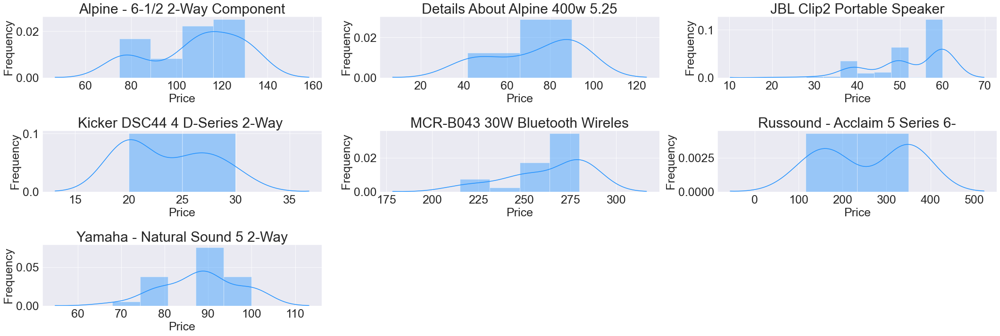

In [24]:
# Price Distribution Plot for top selling products
plt.figure(figsize=(30,50))
plot_number = 1
for name, selection in df_clean.groupby('name'):
    ax = plt.subplot(15,3, plot_number)
    sns.distplot( df_clean.loc[df_clean.name == name, "disc_price"] , color="dodgerblue")
    ax.set(title = name[:30], xlabel = 'Price',ylabel = 'Frequency')

    # Go to the next plot for the next loop
    plot_number = plot_number + 1
    

plt.tight_layout()
    

In [25]:
import plotly.figure_factory as ff

hist_data_combined = []
group_labels_combined = []
colors = ['#A56CC1', '#A6ACEC', '#63F5EF','#F8B195','#F67280','#C06C84', '#6C5B7B']

for name, selection in df_clean.groupby('name'):
    hist_data_combined.append(df_clean.loc[df_clean.name == name, "disc_price"])
    group_labels_combined.append(name)
    
    hist_data = [df_clean.loc[df_clean.name == name, "disc_price"]]
    group_labels = [name]
    
    fig = ff.create_distplot(hist_data, group_labels, show_rug=False)
    fig.update_layout(title_text= name)
    fig.show()

In [26]:
#Putting all together
fig = ff.create_distplot(hist_data_combined, group_labels_combined, colors=colors,
                     bin_size=3.0, show_rug=False)

# Add title
fig.update_layout(title_text='Price Distribution Plot for top selling products')
fig.show()

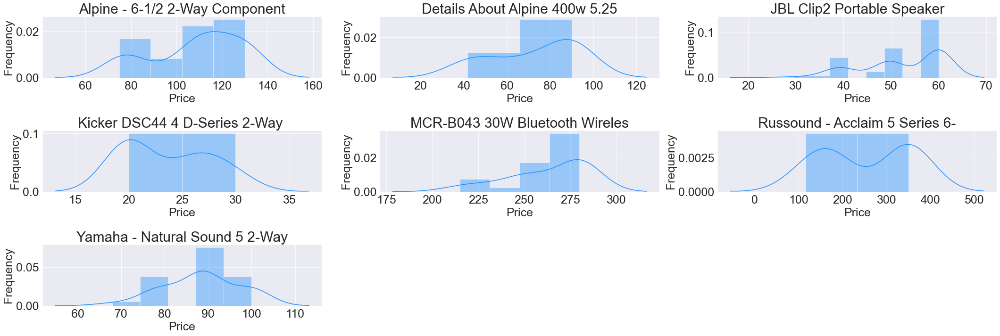

In [27]:
# Price Distribution Plot for top selling products
plt.figure(figsize=(30,50))
plot_number = 1
for name, selection in final_df.groupby('name'):
    ax = plt.subplot(15,3, plot_number)
    sns.distplot( final_df.loc[final_df.name == name, "disc_price"] , color="dodgerblue")
    ax.set(title = name[:30], xlabel = 'Price',ylabel = 'Frequency')

    # Go to the next plot for the next loop
    plot_number = plot_number + 1
    

plt.tight_layout()

In [28]:
hist_data_combined = []
group_labels_combined = []
colors = ['#A56CC1', '#A6ACEC', '#63F5EF','#F8B195','#F67280','#C06C84', '#6C5B7B']

for name, selection in final_df.groupby('name'):
    hist_data_combined.append(final_df.loc[final_df.name == name, "disc_price"])
    group_labels_combined.append(name)
    
    hist_data = [final_df.loc[final_df.name == name, "disc_price"]]
    group_labels = [name]
    
    fig = ff.create_distplot(hist_data, group_labels, show_rug=False)
    fig.update_layout(title_text= name)
    fig.show()

In [29]:
#Putting all together
fig = ff.create_distplot(hist_data_combined, group_labels_combined, colors=colors,
                     bin_size=3.0, show_rug=False)

# Add title
fig.update_layout(title_text='Price Distribution Plot for top selling products')
fig.show()

In [30]:
top_products = final_df['name'].unique().tolist()
print(top_products)

['JBL Clip2 Portable Speaker', 'Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"', 'Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"', 'MCR-B043 30W Bluetooth Wireless Music System (Black)', 'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"', 'Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"', 'Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"']


### Product Summaries 

In [31]:
def summary(name):
    df = final_df[final_df['name'] == name]
    grouping = df.groupby(['disc_price']).size()
    grouping_df = grouping.to_frame().reset_index()
    grouping_df.columns = ['UnitPrice','Quantity']
    return pd.DataFrame(grouping_df)

for name in top_products:
    print(name)
    print(summary(name))
    print()

JBL Clip2 Portable Speaker
    UnitPrice  Quantity
0       25.76         1
1       30.00         1
2       30.47         1
3       33.01         1
4       33.97         1
5       36.99         2
6       37.75         1
7       37.97         1
8       37.99         1
9       38.95        16
10      39.95         7
11      39.99         6
12      40.00         2
13      46.99         8
14      47.98         1
15      47.99         1
16      49.95        12
17      49.99        38
18      52.50         1
19      59.88        25
20      59.95        19
21      59.99        54

Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"
   UnitPrice  Quantity
0      67.99         1
1      75.99         1
2      78.99         6
3      87.99         7
4      89.99         7
5      99.99         7

Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"
   UnitPrice  Quantity
0     116.64         1
1     116.72         2
2     162.92         1
3     165.

## Indiv EDA

In [32]:
def price_distribution_chart(data, name):
    data_selected = data[data['name'] == name]
    data_selected.set_index('Date_imp',inplace=True)
    print(data_selected.index)
    
    fig = figure(
            title = "Price Distribution Chart",
             x_axis_label = 'Time',
             y_axis_label = 'Unit Price',
             width = 800,
             height = 400,
             x_axis_type= "datetime"
            )

    fig.line(data_selected.index,data_selected['disc_price'],
             line_alpha = 0.8,
             line_width = 2
            )

    fig.add_tools(HoverTool(
        tooltips='<font face="Arial" size="3">Date: @x{%F}, Price: @y{0.00}</font>',
        mode='vline',
        formatters={'x': 'datetime'}
    ))

    show(fig)

In [33]:
def df_hour_quantity(data, name):
    hr_qty = data[data['name'] == name].groupby('hour').size()
    hr_qty_df = hr_qty.to_frame().reset_index()
    hr_qty_df.columns = ['hour', 'quantity']
    return hr_qty_df

def bar_chart_hour(hr_qty_df):
    
    hour = hr_qty_df['hour']
    quantity = hr_qty_df['quantity']
    
    n= len(hour)
    
    source = ColumnDataSource(data=dict(hour=hour, quantity=quantity, color=inferno(n)))
    
    max_y = max(quantity)
    
    p = figure(x_range=(0,23), y_range=(0,max_y), plot_height=500, title="Number of items sold per hour",
           toolbar_location=None, tools="")
    
    p.vbar(x='hour', top='quantity', width=0.9, color = 'color', source=source)
    
    p.xgrid.grid_line_color = None
    p.legend.orientation = "horizontal"
    p.legend.location = "top_center"
    
    p.add_tools(HoverTool(tooltips=[("Hour","@hour"),("Quantity", "@quantity")]))

    show(p)

In [34]:
def df_date_quantity(data, name):
    date_qty = pd.DataFrame(data[data['name'] == name].groupby('Date_imp_d').size().reset_index())
    date_qty.columns = ['dates','quantity']
    return date_qty

def bar_chart_date(date_qty):
    date_qty['dates']= pd.to_datetime(date_qty['dates'])
    date = date_qty['dates']
    quantity = date_qty['quantity']
    n = len(date)
    
    source = ColumnDataSource(data=dict(date=date, quantity=quantity))
    
    max_y = max(quantity)
  
    p = figure(x_range= (min(date),max(date)),
               y_range=(0,max_y),
               plot_height=500,
               title="Date of highest purchase",
               x_axis_type = 'datetime',
               toolbar_location=None, 
               tools="")
    
    p.vbar(x='date', top='quantity', width=0.9, source=source)
    
    p.xgrid.grid_line_color = None
    p.legend.orientation = "horizontal"
    p.legend.location = "top_center"
    
    p.add_tools(HoverTool(
        tooltips='<font face="Arial" size="3">Date: @date{%F}, Price: @quantity{0}</font>',
        mode='vline',
        formatters={'@date': 'datetime'}
    ))

    show(p)

In [35]:
def day_df(data,name):
    order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
    day_qty = pd.DataFrame(data[data['name'] == name].groupby('Day_n').size().reindex(order))
    day_qty.columns = ['quantity']
    return day_qty

def day_bar(data, name):
    day_qty = day_df(data,name)

    weekday = day_qty.index.tolist()
    quantity = day_qty['quantity']
    
    source = ColumnDataSource(data=dict(weekday=weekday, quantity=quantity, color=Spectral7))
    
    max_y = max(quantity)
    p = figure(x_range=weekday, y_range=(0,max_y), plot_height=500, title="Items sold per Day",
           toolbar_location=None, tools="")
    
    p.vbar(x='weekday', top='quantity', width=0.9, color='color', source=source)
    
    p.xgrid.grid_line_color = None
    p.legend.orientation = "horizontal"
    p.legend.location = "top_center"
    
    p.add_tools(HoverTool(tooltips=[("Quantity", "@quantity")]))

    show(p)

In [36]:
def price_chart(data, name):
    percentiles = data[data['name'] == name]['disc_price'].quantile([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, .9, 0.95, 1 ])
    
    fig = figure(title = "Price Percentile Distribution",
             x_axis_label = 'Percentile',
             y_axis_label = 'Price',
             width = 800,
             height = 400
            )

    fig.line(percentiles.index,percentiles,
             line_alpha = 0.8,
             line_width = 2
            )

    fig.add_tools(HoverTool(
        tooltips='<font face="Arial" size="3">Percentile: @x{0.00}, Price: @y{0.00}</font>',
        mode='vline'
    ))
    
    show(fig)

In [37]:
def boxplot_month(data, name):
    df =data[data['name'] == name]
    fig = go.Figure()

    fig.update_layout(
        title="Distribution of price per month",
        xaxis_title="Months",
        yaxis_title="Unit Price",
        font=dict(
            family="Arial",
            size=12,
            color="#0E0D0C"
        )
)
    fig.add_trace(go.Box(y=df['disc_price'], x=df['month'])) 
    fig.show()

In [38]:
def boxplot_day(data, name):
    order = {"Day_n": ['Monday', 'Tuesday', 'Wednesday','Thursday','Friday','Saturday','Sunday']}
    df =data[data['name'] == name]
    fig = px.box(df, x="Day_n", y="disc_price",
             title="Distribution of price per day", category_orders=order)    
    fig.show()

### Product 1: 'JBL Clip2 Portable Speaker'

In [39]:
name = 'JBL Clip2 Portable Speaker'

In [40]:
price_chart(final_df, name)

In [41]:
day_bar(final_df, name)

C:\Users\ernes\Anaconda3\lib\site-packages\bokeh\models\plots.py:766: UserWarning:


You are attempting to set `plot.legend.orientation` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


C:\Users\ernes\Anaconda3\lib\site-packages\bokeh\models\plots.py:766: UserWarning:


You are attempting to set `plot.legend.location` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.




In [42]:
price_distribution_chart(final_df, name)

DatetimeIndex(['2017-09-18 14:00:00', '2017-09-18 13:00:00',
               '2017-08-30 07:00:00', '2017-08-12 10:00:00',
               '2017-08-01 00:00:00', '2017-08-01 17:00:00',
               '2017-05-09 15:00:00', '2017-05-18 08:00:00',
               '2017-05-18 04:00:00', '2017-09-17 10:00:00',
               ...
               '2017-06-25 11:00:00', '2017-06-24 20:00:00',
               '2017-06-23 12:00:00', '2017-06-20 01:00:00',
               '2017-11-16 23:00:00', '2017-06-13 20:00:00',
               '2017-06-10 03:00:00', '2017-11-12 12:00:00',
               '2017-09-11 14:00:00', '2017-08-28 12:00:00'],
              dtype='datetime64[ns]', name='Date_imp', length=200, freq=None)


In [43]:
boxplot_month(final_df, name)

In [44]:
boxplot_day(final_df, name)

In [45]:
hr_qty_df = df_hour_quantity(final_df, name)
bar_chart_hour(hr_qty_df)

In [46]:
date_qty = df_date_quantity(final_df, name)
bar_chart_date(date_qty)

### Product 2: 'Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"'

In [47]:
name1 = 'Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"'

In [48]:
price_chart(final_df, name1)

In [49]:
day_bar(final_df, name1)

In [50]:
price_distribution_chart(final_df, name1)

DatetimeIndex(['2017-08-01 05:00:00', '2017-07-26 15:00:00',
               '2017-05-31 19:00:00', '2017-05-09 07:00:00',
               '2017-05-01 05:00:00', '2017-05-18 04:00:00',
               '2017-04-04 04:00:00', '2017-03-30 04:00:00',
               '2017-08-01 05:00:00', '2017-07-26 15:00:00',
               '2017-05-31 19:00:00', '2017-05-09 07:00:00',
               '2017-05-01 05:00:00', '2017-05-18 04:00:00',
               '2017-10-10 05:00:00', '2017-08-28 08:00:00',
               '2017-08-12 10:00:00', '2017-03-30 04:00:00',
               '2017-03-10 15:00:00', '2017-03-04 03:00:00',
               '2017-03-03 15:00:00', '2017-04-04 04:00:00',
               '2017-10-10 05:00:00', '2017-08-28 08:00:00',
               '2017-08-12 10:00:00', '2017-07-09 05:00:00',
               '2017-03-10 15:00:00', '2017-03-04 03:00:00',
               '2017-03-03 15:00:00'],
              dtype='datetime64[ns]', name='Date_imp', freq=None)


In [51]:
boxplot_month(final_df, name1)

In [52]:
boxplot_day(final_df, name1)

In [53]:
hr_qty_df1 = df_hour_quantity(final_df, name1)
bar_chart_hour(hr_qty_df1)

In [54]:
date_qty1 = df_date_quantity(final_df, name1)
bar_chart_date(date_qty1)

### Product 3: Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"

In [55]:
name2 = 'Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"'

In [56]:
price_chart(final_df, name2)

In [57]:
day_bar(final_df, name2)

In [58]:
price_distribution_chart(final_df, name2)

DatetimeIndex(['2017-05-31 19:00:00', '2017-06-01 16:00:00',
               '2017-05-01 14:00:00', '2017-05-09 15:00:00',
               '2017-12-06 21:00:00', '2017-07-28 23:00:00',
               '2017-07-23 04:00:00', '2017-08-25 14:00:00',
               '2017-10-10 20:00:00', '2017-08-30 07:00:00',
               '2017-09-18 13:00:00', '2017-08-01 00:00:00',
               '2017-08-01 17:00:00', '2017-07-26 21:00:00',
               '2017-05-18 08:00:00', '2017-03-30 09:00:00',
               '2017-03-15 17:00:00', '2017-03-10 22:00:00',
               '2017-03-04 10:00:00', '2017-11-09 05:00:00',
               '2017-10-21 15:00:00', '2017-09-17 10:00:00'],
              dtype='datetime64[ns]', name='Date_imp', freq=None)


In [59]:
boxplot_month(final_df, name2)

In [60]:
boxplot_day(final_df, name2)

In [61]:
hr_qty_df2 = df_hour_quantity(final_df, name2)
bar_chart_hour(hr_qty_df2)

In [62]:
date_qty2 = df_date_quantity(final_df, name2)
bar_chart_date(date_qty2)

### Product 4: 'MCR-B043 30W Bluetooth Wireless Music System (Black)'

In [63]:
name3 = 'MCR-B043 30W Bluetooth Wireless Music System (Black)'

In [64]:
price_chart(final_df, name3)

In [65]:
day_bar(final_df, name3)

In [66]:
price_distribution_chart(final_df, name3)

DatetimeIndex(['2017-08-22 01:00:00', '2017-08-19 00:00:00',
               '2017-07-31 22:00:00', '2017-08-01 07:00:00',
               '2017-07-26 20:00:00', '2017-05-09 09:00:00',
               '2017-05-09 03:00:00', '2017-05-01 14:00:00',
               '2017-05-18 05:00:00', '2017-03-30 05:00:00',
               '2017-03-15 20:00:00', '2017-03-10 22:00:00',
               '2017-03-04 10:00:00', '2017-08-31 14:00:00',
               '2017-09-18 12:00:00', '2017-08-29 01:00:00',
               '2017-08-22 01:00:00', '2017-08-19 00:00:00',
               '2017-08-30 05:00:00', '2017-06-03 11:00:00',
               '2017-06-01 18:00:00', '2017-06-01 10:00:00',
               '2017-10-10 05:00:00', '2017-10-10 19:00:00',
               '2017-09-06 17:00:00'],
              dtype='datetime64[ns]', name='Date_imp', freq=None)


In [67]:
boxplot_month(final_df, name3)

In [68]:
boxplot_day(final_df, name3)

In [69]:
hr_qty_df3 = df_hour_quantity(final_df, name3)
bar_chart_hour(hr_qty_df3)

In [70]:
date_qty3 = df_date_quantity(final_df, name3)
bar_chart_date(date_qty3)

### Product 5: 'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"'

In [71]:
name4 = 'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"'

In [72]:
price_chart(final_df, name4)

In [73]:
day_bar(final_df, name4)

In [74]:
price_distribution_chart(final_df, name4)

DatetimeIndex(['2017-12-08 01:00:00', '2017-11-16 18:00:00',
               '2017-10-30 18:00:00', '2017-10-28 19:00:00',
               '2017-11-11 22:00:00', '2017-10-25 00:00:00',
               '2017-10-21 12:00:00', '2017-09-17 07:00:00',
               '2017-09-08 12:00:00', '2017-07-23 06:00:00',
               '2017-06-01 18:00:00', '2017-05-09 11:00:00',
               '2017-05-01 06:00:00', '2017-05-18 04:00:00',
               '2017-04-04 09:00:00', '2017-03-30 05:00:00',
               '2017-03-15 17:00:00', '2017-03-10 16:00:00',
               '2017-03-04 04:00:00', '2017-03-03 15:00:00'],
              dtype='datetime64[ns]', name='Date_imp', freq=None)


In [75]:
boxplot_month(final_df, name4)

In [76]:
boxplot_day(final_df, name4)

In [77]:
hr_qty_df4 = df_hour_quantity(final_df, name4)
bar_chart_hour(hr_qty_df4)

In [78]:
date_qty4 = df_date_quantity(final_df, name4)
bar_chart_date(date_qty4)

### Product 6: 'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"'

In [79]:
name5 = 'Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"'

In [80]:
price_chart(final_df, name5)

In [81]:
day_bar(final_df, name5)

In [82]:
price_distribution_chart(final_df, name5)

DatetimeIndex(['2017-12-08 01:00:00', '2017-11-16 18:00:00',
               '2017-10-30 18:00:00', '2017-10-28 19:00:00',
               '2017-10-24 23:00:00', '2017-11-08 23:00:00',
               '2017-10-21 12:00:00', '2017-10-11 11:00:00',
               '2017-08-24 18:00:00', '2017-10-10 17:00:00',
               '2017-08-29 23:00:00', '2017-08-12 16:00:00',
               '2017-07-31 22:00:00', '2017-08-01 17:00:00',
               '2017-05-31 18:00:00', '2017-05-31 19:00:00',
               '2017-05-09 05:00:00', '2017-05-01 01:00:00',
               '2017-05-18 01:00:00', '2017-04-04 04:00:00',
               '2017-03-30 05:00:00', '2017-03-15 17:00:00',
               '2017-03-10 13:00:00', '2017-03-04 04:00:00',
               '2017-03-03 15:00:00', '2017-10-10 17:00:00',
               '2017-08-29 23:00:00', '2017-08-12 16:00:00',
               '2017-07-31 22:00:00', '2017-08-01 17:00:00',
               '2017-07-08 13:00:00', '2017-07-07 13:00:00',
               '2017-05-

In [83]:
boxplot_month(final_df, name5)

In [84]:
boxplot_day(final_df, name5)

In [85]:
hr_qty_df5 = df_hour_quantity(final_df, name5)
bar_chart_hour(hr_qty_df5)

In [86]:
date_qty5 = df_date_quantity(final_df, name5)
bar_chart_date(date_qty5)

### Product 7: 'Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"'

In [87]:
name6 = 'Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"'

In [88]:
price_chart(final_df, name6)

In [89]:
day_bar(final_df, name6)

In [90]:
price_distribution_chart(final_df, name6)

DatetimeIndex(['2017-03-15 17:00:00', '2017-03-10 16:00:00',
               '2017-03-04 04:00:00', '2017-03-03 15:00:00',
               '2017-08-12 16:00:00', '2017-12-08 01:00:00',
               '2017-10-28 20:00:00', '2017-10-25 03:00:00',
               '2017-10-21 12:00:00', '2017-08-29 23:00:00',
               '2017-10-10 17:00:00', '2017-07-31 22:00:00',
               '2017-08-01 17:00:00', '2017-07-26 20:00:00',
               '2017-06-01 18:00:00', '2017-05-09 11:00:00',
               '2017-05-01 06:00:00', '2017-05-18 04:00:00',
               '2017-04-04 09:00:00', '2017-03-30 05:00:00'],
              dtype='datetime64[ns]', name='Date_imp', freq=None)


In [91]:
boxplot_month(final_df, name6)

In [92]:
boxplot_day(final_df, name6)

In [93]:
hr_qty_df6 = df_hour_quantity(final_df, name6)
bar_chart_hour(hr_qty_df6)

In [94]:
date_qty6 = df_date_quantity(final_df, name6)
bar_chart_date(date_qty6)

## Overall EDA

### Price Distribution Plots

In [95]:
def summary(name):
    df = final_df[final_df['name'] == name]
    grouping = df.groupby(['disc_price']).size()
    grouping_df = grouping.to_frame().reset_index()
    grouping_df.columns = ['UnitPrice','Quantity']
    return pd.DataFrame(grouping_df)


color = ['b-', 'g-', 'r-', 'y-', 'm-', 'c-', 'k-']

def price_distribution_chart_overall(top_products):
    count = 0
    for name in top_products:
        name_df = summary(name)
        plt.plot(name_df.UnitPrice, name_df.Quantity, color[count], label=name )
        count += 1
        
    plt.legend(loc='best')
    plt.show()

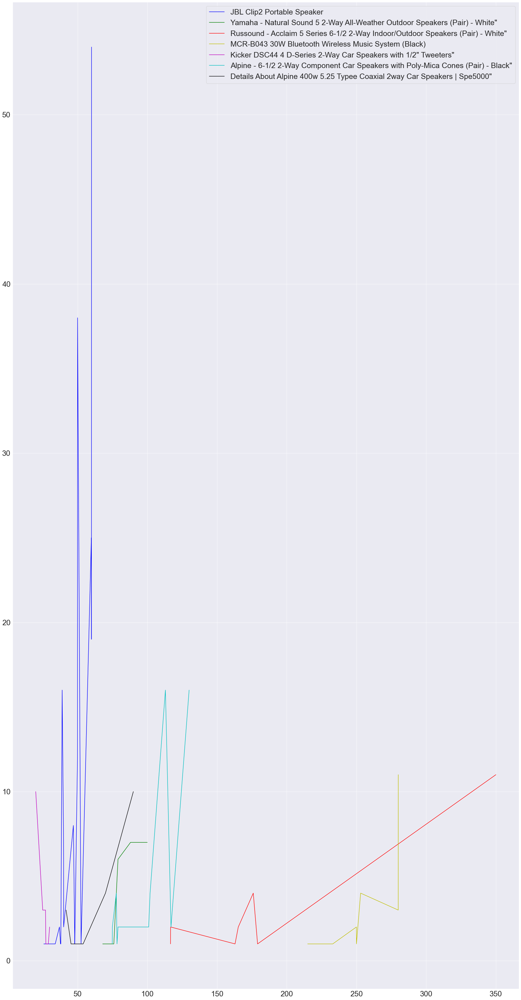

In [96]:
price_distribution_chart_overall(top_products)

In [97]:
import plotly.graph_objects as go
def price_distribution_chart_overall_modified(top_products):
    fig = go.Figure()
    
    for name in top_products:
        name_df = summary(name)
        fig.add_trace(go.Scatter(y=name_df['Quantity'], x= name_df['UnitPrice'], mode = 'lines', name = name))
    fig.show()

In [98]:
price_distribution_chart_overall_modified(top_products)

### Effect of Day of Week on Quantity Sold

In [99]:
def day_df(data,name):
    order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
    day_qty = pd.DataFrame(data[data['name'] == name].groupby('Day_n').size().reindex(order))
    day_qty.columns = ['quantity']
    return day_qty

color = ['blue', 'green', 'red', 'yellow', 'magenta', 'cyan', 'black']
order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

def day_bar_overall(top_products):
    fig = plt.figure(figsize=(15, 10))
    count = 0
    for name in top_products:
        ax = fig.add_subplot(111)
        day_qty = day_df(final_df,name)
        ax.bar(x= order, height=day_qty.loc[order].quantity, color = color[count], align='center', alpha = 0.5)
        count += 1
    plt.legend()
    plt.tight_layout()
    plt.title("Day of week of highest purchase") 
    plt.show()

C:\Users\ernes\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

No handles with labels found to put in legend.


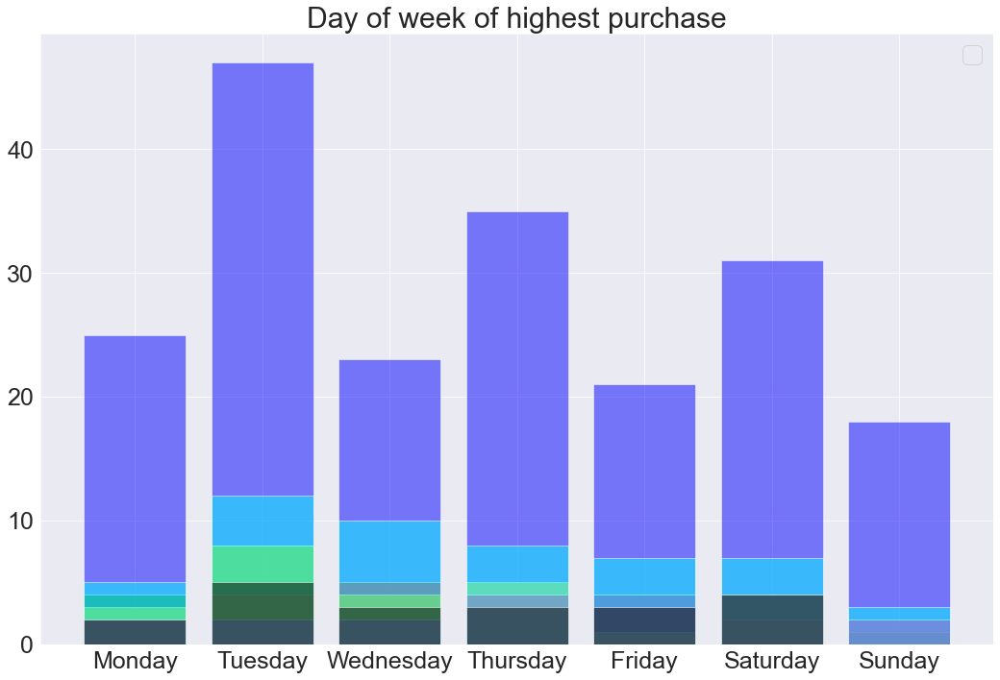

In [100]:
day_bar_overall(top_products)

In [101]:
import plotly.graph_objects as go

def day_bar_overall_modified(top_products):

    data = []
    for name in top_products:
        day_qty = day_df(final_df,name)
        data.append(go.Bar(name = name, x=day_qty.index, y= day_qty['quantity']))
    
    fig = go.Figure(data)
    fig.update_layout(barmode = 'stack')
    fig.show()

In [102]:
day_bar_overall_modified(top_products)

### <font color = green> Conclusion: Slight spike on Tuesdays across all products. Sales increase from Friday to Saturday generally, indicating that the Friday-Saturday period when people end their work might be a good time to leverage on sales

### Effect of Hour of Day on Quantity Sold

In [103]:
def df_hour_quantity(data, name):
    hr_qty = data[data['name'] == name].groupby('hour').size()
    hr_qty_df = hr_qty.to_frame().reset_index()
    hr_qty_df.columns = ['hour', 'quantity']
    return hr_qty_df

def bar_chart_hour_overall(top_products):
    fig = plt.figure(figsize=(15, 10))
    count = 0
    for name in top_products:
        ax = fig.add_subplot(111)
        hr_qty_df = df_hour_quantity(final_df, name)
        ax.bar(x= hr_qty_df['hour'], height=hr_qty_df['quantity'], color = color[count], align='center', alpha = 0.5)
        count += 1
    plt.legend()
    plt.tight_layout()
    plt.xlabel("Hour") 
    plt.ylabel("Quantity")
    plt.title("Hour of highest purchase") 
    plt.show()

C:\Users\ernes\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

No handles with labels found to put in legend.


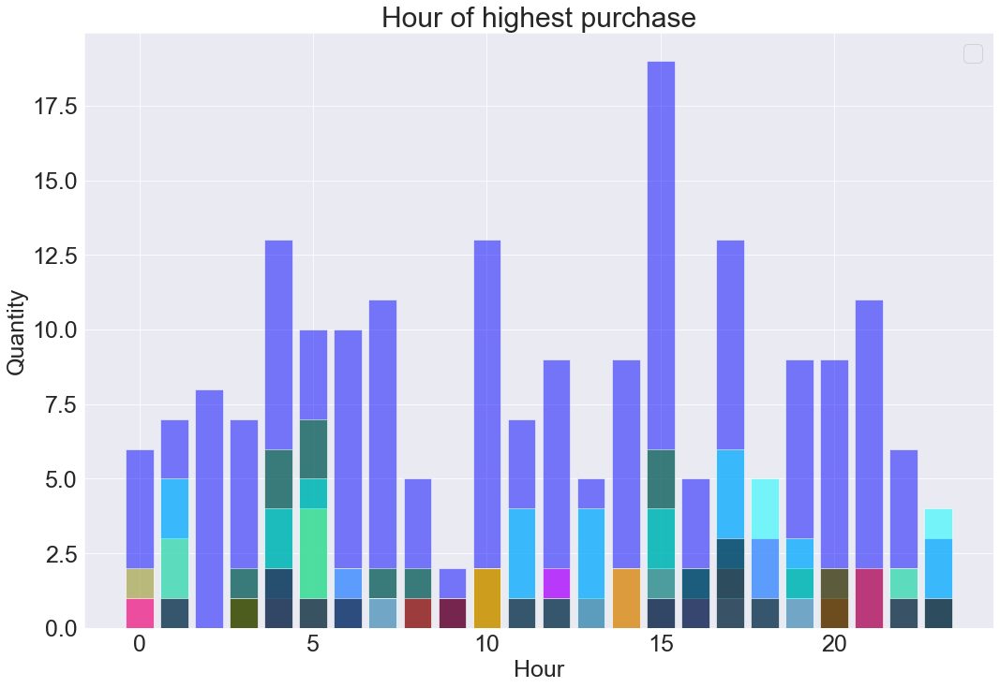

In [104]:
bar_chart_hour_overall(top_products)

In [105]:
def bar_chart_hour_overall_modified(top_products):
    
    data = []
    for name in top_products:
        hr_qty_df = df_hour_quantity(final_df, name)
        data.append(go.Bar(name = name, x=hr_qty_df['hour'], y= hr_qty_df['quantity']))
    
    fig = go.Figure(data)
    fig.update_layout(barmode = 'stack')
    fig.show()

In [106]:
bar_chart_hour_overall_modified(top_products)

### <font color = green> Conclusion: Sales remain high even in the wee hours, indicating people might be increasingly scrolling through sites and making purchases at late hours. This supports a study by John Lewis Partnership Card and released by BBC that "More consumers seem to be shopping online late at night and in the early hours of the morning, say retailers. New data from the John Lewis Partnership Card shows that one in 15 purchases are now made between the hours of midnight and 06:00. The research shows that the number of purchases made in this period rose by 23% in 2018, compared with 2017." Apart from this finding, we find that 3pm and 5pm have higher levels of purchase too for most products 
    
*https://www.bbc.com/news/business-49633006*
    

### Effect of Month on Quantity Sold

In [107]:
def df_month_quantity(data, name):
    month_qty = pd.DataFrame(data[data['name'] == name].groupby('month').size()).reset_index()
    month_qty.columns = ['month','quantity']
    return month_qty

def bar_chart_month_overall(top_products):
    fig = plt.figure(figsize=(15, 10))
    count = 0
    for name in top_products:
        ax = fig.add_subplot(111)
        month_qty_df = df_month_quantity(final_df, name)
        ax.bar(x= month_qty_df['month'], height=month_qty_df['quantity'], color = color[count], align='center', alpha = 0.5)
        count += 1
    plt.legend()
    plt.tight_layout()
    plt.xlabel("Month") 
    plt.ylabel("Quantity")
    plt.title("Month of highest purchase") 
    plt.show()

C:\Users\ernes\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

No handles with labels found to put in legend.


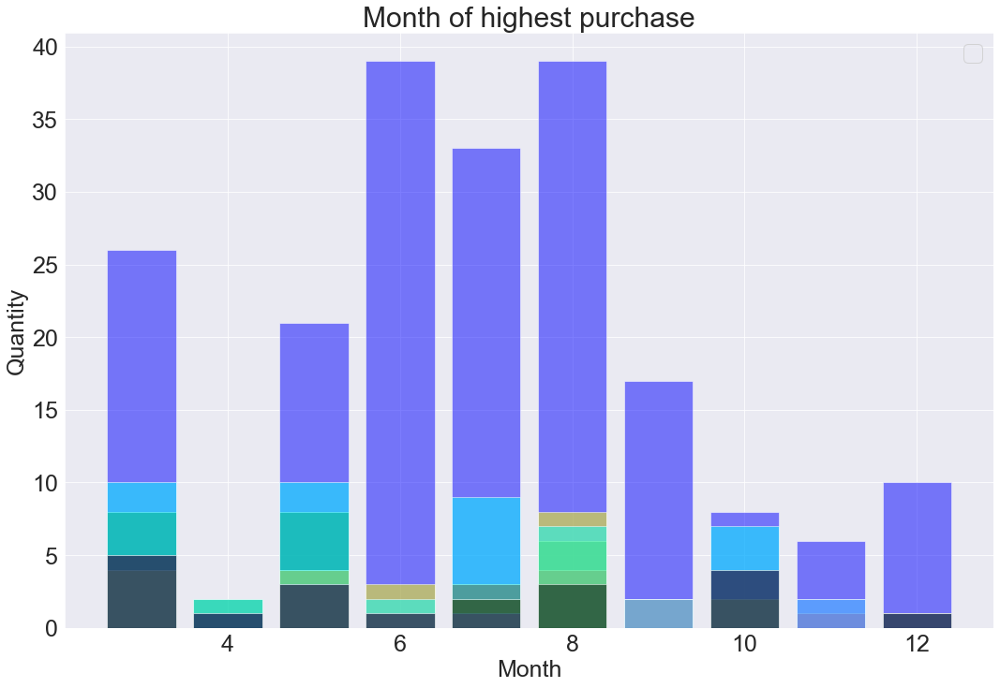

In [108]:
bar_chart_month_overall(top_products)

In [109]:
def bar_chart_month_overall_modified(top_products):
    
    data = []
    for name in top_products:
        month_qty_df = df_month_quantity(final_df, name)
        data.append(go.Bar(name = name, x=month_qty_df['month'], y= month_qty_df['quantity']))
    
    fig = go.Figure(data)
    fig.update_layout(barmode = 'stack')
    fig.show()

In [110]:
bar_chart_month_overall_modified(top_products)

### <font color = green> Based on this data from March till December, we can see that there are generally higher number of purchases in months July and August for each item. We can attribute this to the holiday season coming to an end, where both students & working adults get back to school / work and manufacturers are found to generally promote products during this back-to-school/work period

### Individual Regression Analysis

In [111]:
testing = final_df.loc[final_df['name'] == 'JBL Clip2 Portable Speaker']
print(testing['price'].nunique())
print(testing['disc_price'].nunique())

15
22


In [112]:
def display_regression_plot(data):
    sns.pairplot(data, kind = 'reg', size = 3, x_vars = ['UnitPrice'], y_vars = ['Quantity'])
    plt.show()

In [113]:
from __future__ import print_function
from statsmodels.compat import lzip
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [114]:
def ols_summary_log_skewQ(data):
    model = ols("np.log(Quantity) ~ UnitPrice", data = data).fit()
    print(model.summary())

In [115]:
def ols_summary_log_skewP(data):
    model = ols("Quantity ~ np.log(UnitPrice)", data = data).fit()
    print(model.summary())

In [116]:
def ols_summary_log_skewBoth(data):
    model = ols("np.log(Quantity) ~ np.log(UnitPrice)", data = data).fit()
    print(model.summary())

In [117]:
def partial_regression_plot(model):
    fig = plt.figure(figsize=(12,8))
    sm.graphics.plot_partregress_grid(model, fig = fig)

In [118]:
def ccpr_plot(model):
    fig = plt.figure(figsize=(12,8))
    sm.graphics.plot_ccpr_grid(model, fig = fig)

In [119]:
def rls_summary_log(data):
    endog = np.log(data['Quantity'])
    exog = sm.add_constant(np.log(data['UnitPrice']))
    mod = sm.RecursiveLS(endog, exog)
    res = mod.fit()
    print(res.summary())
    res.plot_recursive_coefficient(range(mod.k_exog), alpha=None, figsize=(10,6));

In [120]:
def summary_df(i):
    testing = final_df.loc[final_df['name'] == i]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    return pd.DataFrame(test_df)

In [121]:
for name in top_products:
    print(name)
    print(summary_df(name))
    print()

JBL Clip2 Portable Speaker
    UnitPrice  Quantity
0       25.76         1
1       30.00         1
2       30.47         1
3       33.01         1
4       33.97         1
5       36.99         2
6       37.75         1
7       37.97         1
8       37.99         1
9       38.95        16
10      39.95         7
11      39.99         6
12      40.00         2
13      46.99         8
14      47.98         1
15      47.99         1
16      49.95        12
17      49.99        38
18      52.50         1
19      59.88        25
20      59.95        19
21      59.99        54

Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"
   UnitPrice  Quantity
0      67.99         1
1      75.99         1
2      78.99         6
3      87.99         7
4      89.99         7
5      99.99         7

Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"
   UnitPrice  Quantity
0     116.64         1
1     116.72         2
2     162.92         1
3     165.

### Check skewness

In [122]:
def check_skew(top_products):
    newDict = {
        'Item': [],
        'Skewness Price':[],
        'Skewness Quantity':[]
    }
    for name in top_products:
        df = summary(name)
        skew = df.skew()
        newDict['Item'].append(name)
        newDict['Skewness Price'].append(skew[0])
        newDict['Skewness Quantity'].append(skew[1])
        
    return pd.DataFrame(newDict)

In [123]:
top_products_skew = check_skew(top_products)

In [124]:
top_products_skew

,Item,Skewness Price,Skewness Quantity
0,JBL Clip2 Portable Speaker,0.368479,2.182837
1,Yamaha - Natural Sound 5 2-Way All-Weather Out...,0.125255,-0.900057
2,Russound - Acclaim 5 Series 6-1/2 2-Way Indoor...,2.031307,2.219302
3,MCR-B043 30W Bluetooth Wireless Music System (...,0.351107,2.431556
4,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,-1.300025,2.074053
5,Alpine - 6-1/2 2-Way Component Car Speakers wi...,0.698807,1.793926
6,Details About Alpine 400w 5.25 Typee Coaxial 2...,1.228562,1.804673


## Summary Regression Plots & Analysis

In [125]:
def all_top_regress(i):
    testing = final_df.loc[final_df['name'] == i]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    return display_regression_plot(test_df)

JBL Clip2 Portable Speaker


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



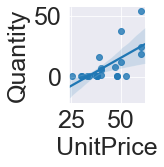

Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White"


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



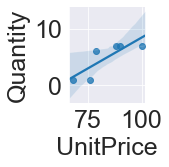

Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White"


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



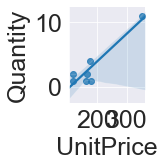

MCR-B043 30W Bluetooth Wireless Music System (Black)


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



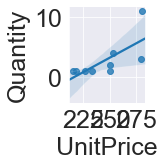

Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



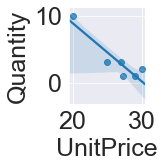

Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



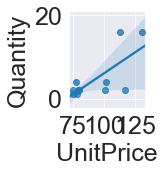

Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000"


C:\Users\ernes\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2065: UserWarning:

The `size` parameter has been renamed to `height`; pleaes update your code.



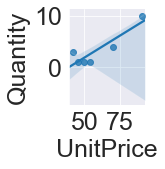

In [126]:
for i in top_products:
    print(i)
    all_top_regress(i)

In [127]:
def all_top(i):
    testing = final_df.loc[final_df['name'] == i]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    
    skew = []
    skew_values = test_df.skew()
    skew.append(skew_values[0])
    skew.append(skew_values[1])
    
    if abs(skew[0]) > 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewBoth(test_df)
    
    elif abs(skew[0]) < 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewQ(test_df)
    
    elif abs(skew[0]) > 0.5 and abs(skew[1]) < 0.5:
        return ols_summary_log_skewP(test_df)

In [128]:
for i in top_products:
    print('*'*20,i, "*"*20)
    all_top(i)

******************** JBL Clip2 Portable Speaker ********************
                            OLS Regression Results                            
Dep. Variable:       np.log(Quantity)   R-squared:                       0.466
Model:                            OLS   Adj. R-squared:                  0.439
Method:                 Least Squares   F-statistic:                     17.42
Date:                Thu, 22 Apr 2021   Prob (F-statistic):           0.000468
Time:                        17:41:53   Log-Likelihood:                -31.695
No. Observations:                  22   AIC:                             67.39
Df Residuals:                      20   BIC:                             69.57
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\stats\stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 6 samples were given.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\stats\stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 7 samples were given.

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\stats.py:1450: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=9

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\stats\stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 6 samples were given.

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\stats.py:1450: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=11



                            OLS Regression Results                            
Dep. Variable:       np.log(Quantity)   R-squared:                       0.737
Model:                            OLS   Adj. R-squared:                  0.671
Method:                 Least Squares   F-statistic:                     11.21
Date:                Thu, 22 Apr 2021   Prob (F-statistic):             0.0286
Time:                        17:41:53   Log-Likelihood:                -3.0582
No. Observations:                   6   AIC:                             10.12
Df Residuals:                       4   BIC:                             9.700
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            17.4234      4.95

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\stats\stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 6 samples were given.



### <font color = green>Based on the P values above, we are unable to reject the null hypothesis of 2 items: Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White'' and Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000" as they have a P value of 0.052 and 0.085, above the significance level. Hence, there might not be a real relationship between price and quantity even if the r^2 is high as it might be due to pure chance. However, for the rest of the items, we can see that P Value is below the significance level of 0.05 and can reject the null hypothesis. R^2 values for all the 7 products are at least about 0.5 which represents that the model is able to explain the variation in quantity demanded at least half the time. This models will then be used for PED calculations. </font> 

In [129]:
def all_top_rls(i):
    testing = final_df.loc[final_df['name'] == i]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    endog = np.log(test_df['Quantity'])
    exog = sm.add_constant(np.log(test_df['UnitPrice']))
    mod = sm.RecursiveLS(endog, exog)
    res = mod.fit()
    print(res.summary())
    print(res.plot_recursive_coefficient(range(mod.k_exog), alpha=None, figsize=(10,6)))

                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                   22
Model:                    RecursiveLS   Log Likelihood                 -33.662
Date:                Thu, 22 Apr 2021   R-squared:                       0.442
Time:                        17:41:53   AIC                             71.324
Sample:                             0   BIC                             73.506
                                 - 22   HQIC                            71.838
Covariance Type:            nonrobust   Scale                            1.201
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -13.9216      3.808     -3.656      0.000     -21.386      -6.458
UnitPrice      4.0558      1.020      3.977      0.000       2.057       6.055
Ljung-Box (Q):                         nan   Jarque-

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                    6
Model:                    RecursiveLS   Log Likelihood                  -5.347
Date:                Thu, 22 Apr 2021   R-squared:                       0.680
Time:                        17:41:54   AIC                             14.695
Sample:                             0   BIC                             14.278
                                  - 6   HQIC                            13.027
Covariance Type:            nonrobust   Scale                            0.390
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -24.8451      8.970     -2.770      0.006     -42.425      -7.265
UnitPrice      5.9129      2.030      2.913      0.004       1.934       9.892
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2214: UserWarning:

Early subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2219: UserWarning:

Later subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in greater

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in less

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1807: RuntimeWarning:

invalid value encountered 

Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                    7
Model:                    RecursiveLS   Log Likelihood                  -7.513
Date:                Thu, 22 Apr 2021   R-squared:                       0.584
Time:                        17:41:54   AIC                             19.025
Sample:                             0   BIC                             18.917
                                  - 7   HQIC                            17.688
Covariance Type:            nonrobust   Scale                            0.400
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -8.8183      3.615     -2.440      0.015     -15.903      -1.734
UnitPrice      1.8616      0.703      2.650      0.008       0.485       3.239
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                    9
Model:                    RecursiveLS   Log Likelihood                  -7.185
Date:                Thu, 22 Apr 2021   R-squared:                       0.663
Time:                        17:41:54   AIC                             18.370
Sample:                             0   BIC                             18.764
                                  - 9   HQIC                            17.518
Covariance Type:            nonrobust   Scale                            0.285
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -38.7250     10.613     -3.649      0.000     -59.527     -17.923
UnitPrice      7.1570      1.930      3.708      0.000       3.374      10.940
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2222: RuntimeWarning:

divide by zero encountered in double_scalars



Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                    6
Model:                    RecursiveLS   Log Likelihood                  -4.461
Date:                Thu, 22 Apr 2021   R-squared:                       0.737
Time:                        17:41:55   AIC                             12.923
Sample:                             0   BIC                             12.506
                                  - 6   HQIC                            11.255
Covariance Type:            nonrobust   Scale                            0.243
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.4234      4.950      3.520      0.000       7.722      27.125
UnitPrice     -5.0735      1.515     -3.348      0.001      -8.044      -2.103
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2214: UserWarning:

Early subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2219: UserWarning:

Later subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in greater

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in less

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1807: RuntimeWarning:

invalid value encountered 

Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                   11
Model:                    RecursiveLS   Log Likelihood                 -12.267
Date:                Thu, 22 Apr 2021   R-squared:                       0.498
Time:                        17:41:55   AIC                             28.534
Sample:                             0   BIC                             29.330
                                 - 11   HQIC                            28.032
Covariance Type:            nonrobust   Scale                            0.501
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        -13.6898      4.940     -2.771      0.006     -23.372      -4.008
UnitPrice      3.2674      1.092      2.991      0.003       1.126       5.409
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



Figure(720x432)
                           Statespace Model Results                           
Dep. Variable:               Quantity   No. Observations:                    6
Model:                    RecursiveLS   Log Likelihood                  -6.596
Date:                Thu, 22 Apr 2021   R-squared:                       0.565
Time:                        17:41:56   AIC                             17.192
Sample:                             0   BIC                             16.775
                                  - 6   HQIC                            15.525
Covariance Type:            nonrobust   Scale                            0.502
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -9.2429      4.416     -2.093      0.036     -17.899      -0.587
UnitPrice      2.4901      1.093      2.278      0.023       0.348       4.632
Ljung-Box (Q):                      

C:\Users\ernes\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2214: UserWarning:

Early subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:2219: UserWarning:

Later subset of data for variable 0  has too few non-missing observations to calculate test statistic.

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in greater

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:901: RuntimeWarning:

invalid value encountered in less

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1807: RuntimeWarning:

invalid value encountered 

Figure(720x432)


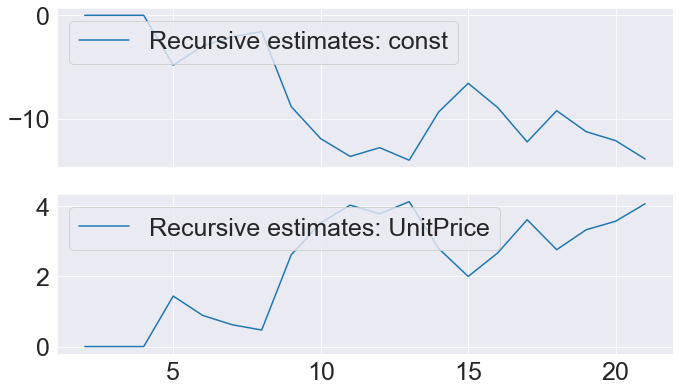

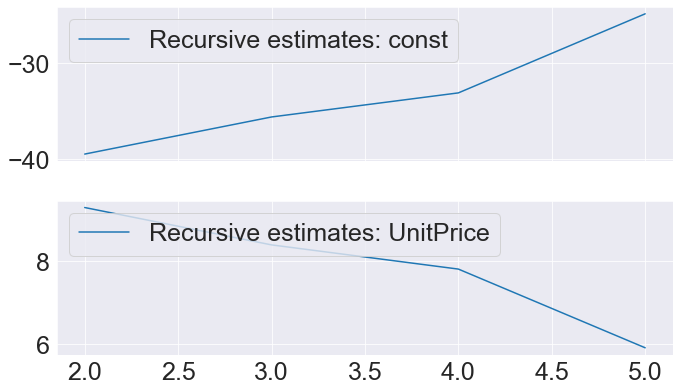

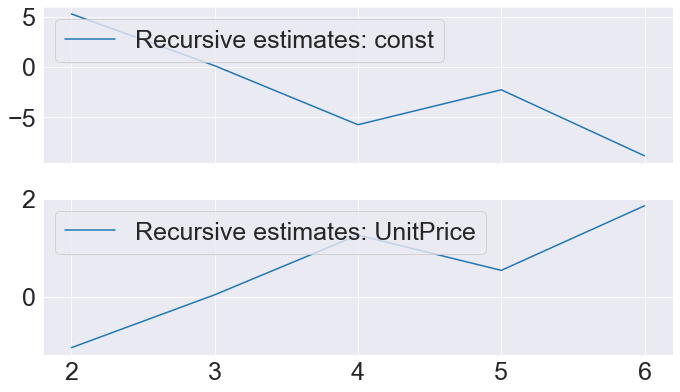

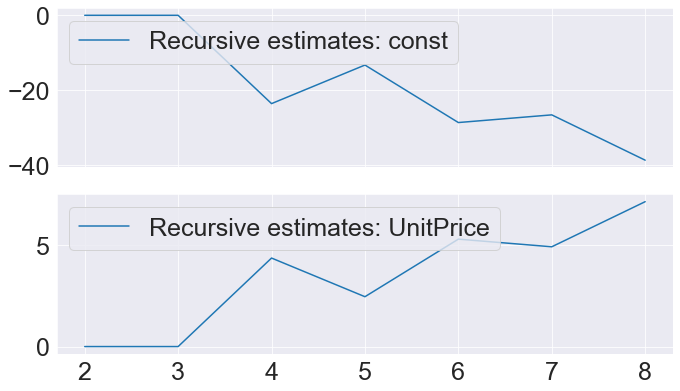

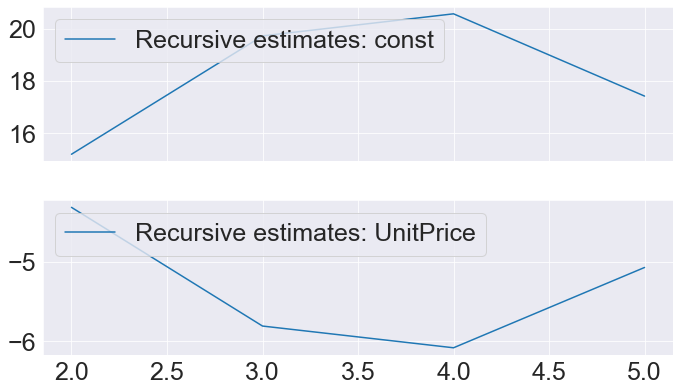

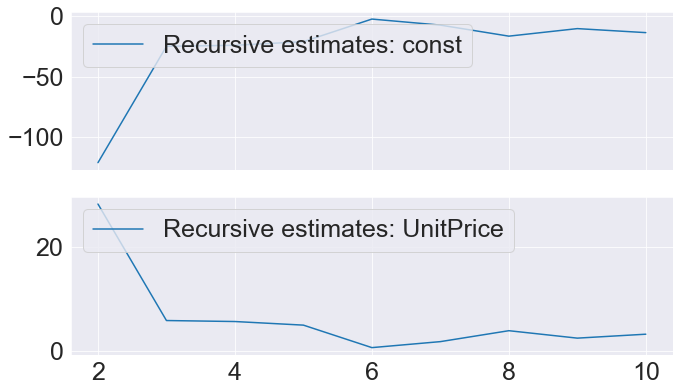

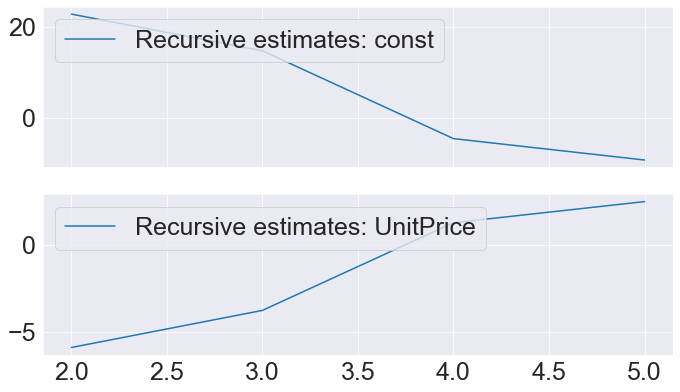

In [130]:
for name in top_products:
    all_top_rls(name)

In [131]:
def PED(top_products): 
    newDict = {
        'Item': [],
        'Price Elasticity of Demand':[]
    }
    
    for name in top_products: 
        data = summary(name)
        model = ols("np.log(Quantity) ~ UnitPrice", data = data).fit()
        intercept, slope = model.params
        mean_price = np.mean(data['UnitPrice'])
        mean_quantity = np.mean(data['Quantity'])
        price_elasticity = ((slope) * (mean_price/mean_quantity))

        newDict['Item'].append(name)
        newDict['Price Elasticity of Demand'].append(price_elasticity)
    
    return pd.DataFrame(newDict)

In [132]:
ped_df = PED(top_products)
ped_df

,Item,Price Elasticity of Demand
0,JBL Clip2 Portable Speaker,0.460832
1,Yamaha - Natural Sound 5 2-Way All-Weather Out...,1.205046
2,Russound - Acclaim 5 Series 6-1/2 2-Way Indoor...,0.527664
3,MCR-B043 30W Bluetooth Wireless Music System (...,2.581848
4,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,-1.619647
5,Alpine - 6-1/2 2-Way Component Car Speakers wi...,0.675318
6,Details About Alpine 400w 5.25 Typee Coaxial 2...,0.735352


In [133]:
def ols_r2(products):
    newDict = {
        'Item': [],
        'R Squared Value':[]
    }
    for name in top_products: 
        data = summary(name)
        model = ols("np.log(Quantity) ~ UnitPrice", data = data).fit()
        newDict['Item'].append(name)
        newDict['R Squared Value'].append(model.rsquared)
    return pd.DataFrame(newDict)

In [134]:
ols_r2(top_products)

,Item,R Squared Value
0,JBL Clip2 Portable Speaker,0.465570
1,Yamaha - Natural Sound 5 2-Way All-Weather Out...,0.651244
2,Russound - Acclaim 5 Series 6-1/2 2-Way Indoor...,0.653298
3,MCR-B043 30W Bluetooth Wireless Music System (...,0.675435
4,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,0.719079
5,Alpine - 6-1/2 2-Way Component Car Speakers wi...,0.513009
6,Details About Alpine 400w 5.25 Typee Coaxial 2...,0.636462


<BarContainer object of 7 artists>

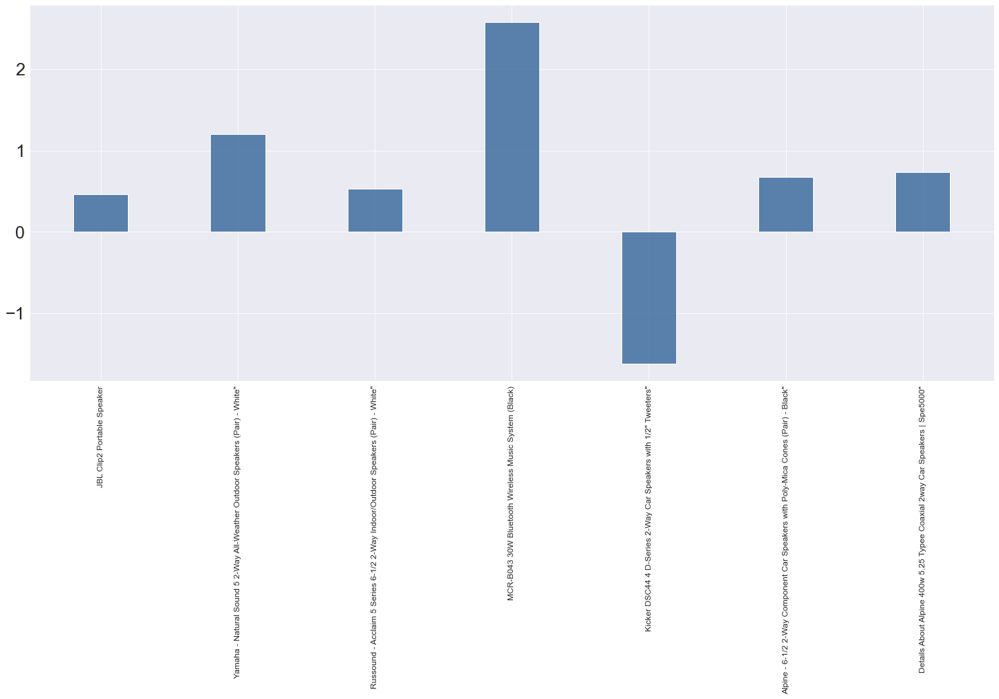

In [135]:
plt.figure(figsize=(25, 10))
plt.xticks(rotation=90, fontsize= 12)
plt.bar(ped_df['Item'], ped_df['Price Elasticity of Demand'], color=(0.2, 0.4, 0.6, 0.8),  width = 0.4) 

### <font color = green>We can see that there is quite a distribution of elasticities. Also, it is worthy to note that most of these Speaker products are considered Veblen goods (due to the positive PED) except for one. This means that as price increases, quantity demanded increases too. Interpreting each item PED values are as follows:</font> 


- JBL Clip2 Portable speaker: PED of 0.461 indicates that a 10% increase in the price for the jar results in a 4.61% increase in quantity demanded. Absolute value of PED is less than 1 so its quantity demanded is price inelastic.
- Yamaha - Natural Sound 5 2-Way All-Weather Outdoor Speakers (Pair) - White: PED of 1.205 indicates that a 10% increase in the price for the bag results in a 12% increase in quantity demanded. Absolute value of PED is more than 1 so its quantity demanded is price elastic.
- Russound - Acclaim 5 Series 6-1/2 2-Way Indoor/Outdoor Speakers (Pair) - White": PED of 0.527 indicates that a 10% increase in the price for the light holder results in a 5.27% increase in quantity demanded. Absolute value of PED is less than 1 so its quantity demanded is price inelastic.
- MCR-B043 30W Bluetooth Wireless Music System (Black): PED of 2.58 indicates that a 10% increase in the price for the light results in a 25% increase in quantity demanded. Absolute value of PED is more than 1 so its quantity demanded is price elastic.
- Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters": PED of -1.619 indicates that a 10% increase in the price for the popcorn holder results in a 16% decrease in quantity demanded. Absolute value of PED is more than 1 so its quantity demanded is price elastic.
- Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black": PED of 0.675 indicates that a 10% increase in the price for the light holder results in a 6.75% increase in quantity demanded. Absolute value of PED is less than 1 so its quantity demanded is price inelastic.
- Details About Alpine 400w 5.25 Typee Coaxial 2way Car Speakers | Spe5000": PED of 0.735 indicates that a 10% increase in the price for the light holder results in a 7.35% increase in quantity demanded. Absolute value of PED is less than 1 so its quantity demanded is price inelastic.  

## Contextual investigation: campaign vs non campaign periods

In [136]:
def campaign_check(final_df):
    if final_df['disc_price'] < final_df['price']:
        val = 1
        #campaign
    else:
        val = 0
        #campaign

    return val

In [137]:
final_df['campaign'] = final_df.apply(campaign_check, axis=1)

In [138]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 368 entries, 26802 to 17107
Data columns (total 31 columns):
Date_imp           368 non-null datetime64[ns]
Date_imp_d         368 non-null object
Cluster            368 non-null int64
Category_name      368 non-null object
name               368 non-null object
price              368 non-null float64
disc_price         368 non-null float64
merchant           368 non-null object
Disc_percentage    368 non-null float64
isSale             368 non-null object
Imp_count          368 non-null int64
brand              368 non-null object
p_description      368 non-null object
currency           368 non-null object
dateAdded          368 non-null object
dateSeen           368 non-null object
dateUpdated        368 non-null object
imageURLs          0 non-null object
manufacturer       319 non-null object
shipping           145 non-null object
sourceURLs         176 non-null object
weight             368 non-null object
Date_imp_d.1       368 n

In [139]:
final_df.head()

,Date_imp,Date_imp_d,Cluster,Category_name,name,price,disc_price,merchant,Disc_percentage,isSale,...,weight,Date_imp_d.1,Day_n,year,month,month_n,day,Week_Number,hour,campaign
26802,2017-09-18 14:00:00,2017/09/18,35,"speaker, portable, bluetooth",JBL Clip2 Portable Speaker,49.99,49.99,Bestbuy.com,0.0,No,...,6.5 ounces,2017/09/18,Monday,2017,9,September,18,38,14,0
26803,2017-09-18 13:00:00,2017/09/18,35,"speaker, portable, bluetooth",JBL Clip2 Portable Speaker,49.99,49.99,Bestbuy.com,0.0,No,...,6.5 ounces,2017/09/18,Monday,2017,9,September,18,38,13,0
26804,2017-08-30 07:00:00,2017/08/30,35,"speaker, portable, bluetooth",JBL Clip2 Portable Speaker,49.99,49.99,Bestbuy.com,0.0,No,...,6.5 ounces,2017/08/30,Wednesday,2017,8,August,30,35,7,0
26805,2017-08-12 10:00:00,2017/08/12,35,"speaker, portable, bluetooth",JBL Clip2 Portable Speaker,49.99,49.99,Bestbuy.com,0.0,No,...,6.5 ounces,2017/08/12,Saturday,2017,8,August,12,32,10,0
26806,2017-08-01 00:00:00,2017/08/01,35,"speaker, portable, bluetooth",JBL Clip2 Portable Speaker,49.99,49.99,Bestbuy.com,0.0,No,...,6.5 ounces,2017/08/01,Tuesday,2017,8,August,1,31,0,0


In [140]:
#groupby for campaign 
test = pd.DataFrame(final_df.groupby(['name','campaign']).size(), columns = ['count'])

test.reset_index()

,name,campaign,count
0,Alpine - 6-1/2 2-Way Component Car Speakers wi...,0,50
1,Alpine - 6-1/2 2-Way Component Car Speakers wi...,1,2
2,Details About Alpine 400w 5.25 Typee Coaxial 2...,0,20
3,JBL Clip2 Portable Speaker,0,192
4,JBL Clip2 Portable Speaker,1,8
5,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,0,15
6,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,1,5
7,MCR-B043 30W Bluetooth Wireless Music System (...,0,25
8,Russound - Acclaim 5 Series 6-1/2 2-Way Indoor...,0,22
9,Yamaha - Natural Sound 5 2-Way All-Weather Out...,0,29


Due to the low during-cammpaign transactions that make it unrepresentative for regression modelling, we will focus on comparing the overall data for each product (i.e. during campaign + non campaign) vs during non campaign sales

In [141]:
def context_ols_c(i):
    testing = final_df.loc[(final_df['name'] == name1) & (final_df['campaign'] == 1)]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    
    skew = []
    skew_values = test_df.skew()
    skew.append(skew_values[0])
    skew.append(skew_values[1])
    
    if abs(skew[0]) > 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewBoth(test_df)
    
    elif abs(skew[0]) < 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewQ(test_df)
    
    elif abs(skew[0]) > 0.5 and abs(skew[1]) < 0.5:
        return ols_summary_log_skewP(test_df)

In [142]:
def context_ols_nc(i):
    testing = final_df.loc[(final_df['name'] == i) & (final_df['campaign'] == 0)]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    #print(test_df)
    
    skew = []
    skew_values = test_df.skew()
    skew.append(skew_values[0])
    skew.append(skew_values[1])
    
    if abs(skew[0]) > 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewBoth(test_df)
    
    elif abs(skew[0]) < 0.5 and abs(skew[1]) > 0.5:
        return ols_summary_log_skewQ(test_df)
    
    elif abs(skew[0]) > 0.5 and abs(skew[1]) < 0.5:
        return ols_summary_log_skewP(test_df)

In [143]:
def summary_nocampaign(name):
    testing = final_df.loc[(final_df['name'] == name) & (final_df['campaign'] == 0)]
    tester = testing.groupby(['disc_price']).size()
    test_df = tester.to_frame().reset_index()
    test_df.columns = ['UnitPrice','Quantity']
    return pd.DataFrame(test_df)

In [144]:
def ped_context(products):
    newDict = {
        'Item': [],
        'PED (Overall)':[],
        'PED (No Campaign)': []
    }
    
    for name in products: 
        data = summary(name)
        model = ols("np.log(Quantity) ~ UnitPrice", data = data).fit()
        intercept, slope = model.params
        mean_price = np.mean(data['UnitPrice'])
        mean_quantity = np.mean(data['Quantity'])
        price_elasticity = ((slope) * (mean_price/mean_quantity))

        newDict['Item'].append(name)
        newDict['PED (Overall)'].append(price_elasticity)
        
        data = summary_nocampaign(name)
        model = ols("np.log(Quantity) ~ UnitPrice", data = data).fit()
        intercept, slope = model.params
        mean_price = np.mean(data['UnitPrice'])
        mean_quantity = np.mean(data['Quantity'])
        price_elasticity = ((slope) * (mean_price/mean_quantity))
        newDict['PED (No Campaign)'].append(price_elasticity)
        
    
    return pd.DataFrame(newDict)

In [145]:
products_check = ['Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"',
                 'JBL Clip2 Portable Speaker',
                 'Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters"']

In [146]:
for i in products_check:
    print(i)
    context_ols_nc(i)

Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black"
                            OLS Regression Results                            
Dep. Variable:       np.log(Quantity)   R-squared:                       0.491
Model:                            OLS   Adj. R-squared:                  0.427
Method:                 Least Squares   F-statistic:                     7.719
Date:                Thu, 22 Apr 2021   Prob (F-statistic):             0.0240
Time:                        17:42:03   Log-Likelihood:                -10.196
No. Observations:                  10   AIC:                             24.39
Df Residuals:                       8   BIC:                             25.00
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\stats.py:1450: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=10

C:\Users\ernes\Anaconda3\lib\site-packages\scipy\stats\stats.py:1450: UserWarning:

kurtosistest only valid for n>=20 ... continuing anyway, n=14

C:\Users\ernes\Anaconda3\lib\site-packages\statsmodels\stats\stattools.py:71: ValueWarning:

omni_normtest is not valid with less than 8 observations; 4 samples were given.



In [147]:
ped_context(products_check)

,Item,PED (Overall),PED (No Campaign)
0,Alpine - 6-1/2 2-Way Component Car Speakers wi...,0.675318,0.657709
1,JBL Clip2 Portable Speaker,0.460832,0.354785
2,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,-1.619647,-1.417046


In [148]:
main = ped_context(products_check)

difference_dict = {
    'Item' : [],
    'Difference %' : []
}

for index, row in main.iterrows():
    difference_dict['Item'].append(row['Item'])
    overall = row['PED (Overall)']
    nocampaign = row['PED (No Campaign)']
    
    difference = nocampaign - overall 
    
    difference_dict['Difference %'].append((difference/abs(overall))*100)
    
campaignped = pd.DataFrame(difference_dict)

campaignped

,Item,Difference %
0,Alpine - 6-1/2 2-Way Component Car Speakers wi...,-2.607497
1,JBL Clip2 Portable Speaker,-23.011979
2,Kicker DSC44 4 D-Series 2-Way Car Speakers wit...,12.508978


In [149]:
item = campaignped['Item']
difference = campaignped['Difference %']

source = ColumnDataSource(data=dict(item=item, difference=difference, color=Spectral3))

max_y = max(difference)
min_y = min(difference)

p = figure(x_range=item, y_range=(min_y + min_y*0.2,max_y + max_y *0.2), plot_height=1000, title="Percentage change in PED for Campaigns",
       toolbar_location=None, tools="")

p.vbar(x='item', top='difference', width=0.9, color='color', source=source)

p.xgrid.grid_line_color = None
p.legend.orientation = "horizontal"
p.legend.location = "top_center"
p.xaxis.major_label_orientation = math.pi/2
p.add_tools(HoverTool(tooltips=[("Percentage Difference", "@difference")]))

show(p)

C:\Users\ernes\Anaconda3\lib\site-packages\bokeh\models\plots.py:766: UserWarning:


You are attempting to set `plot.legend.orientation` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


C:\Users\ernes\Anaconda3\lib\site-packages\bokeh\models\plots.py:766: UserWarning:


You are attempting to set `plot.legend.location` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.




- JBL Clip2 Portable speaker: PED of 0.354 (from 0.460) indicates that a 10% increase in the price for the jar results in a 3.54% increase in quantity demanded. [Absolute value of PED is less than 1 so its quantity demanded is price inelastic.] So, by only considering the non campaign period, we see that quantity demanded is more price inelastic than overall. 

- Kicker DSC44 4 D-Series 2-Way Car Speakers with 1/2" Tweeters": PED of -1.417 (from -1.619) indicates that a 10% increase in the price for the popcorn holder results in a 14% decrease in quantity demanded. [Absolute value of PED is more than 1 so its quantity demanded is price elastic.] So, by only considering the non campaign period, we see that quantity demanded is less price elastic than overall. 

- Alpine - 6-1/2 2-Way Component Car Speakers with Poly-Mica Cones (Pair) - Black": PED of 0.657 (from 0.675) indicates that a 10% increase in the price for the light holder results in a 6.57% increase in quantity demanded. [Absolute value of PED is less than 1 so its quantity demanded is price inelastic.] So, by only considering the non campaign period, we see that quantity demanded is more price inelastic than overall. 

We can see that PED (No Campaign) values are slightly lower than PED (overall) values across all 3 products which have campaign and non campaign periods. <b>People are less sensitive to price changes during non campaign periods than during campaign periods.</b>
